# Prediction of GitHub Stars

## Data:

The data is about GitHub projects with more than 167 stars from other users, indicating the popularity of a repository. It consists of 215029 rows corresponding to the top repositories and 24 attributes such as the name and description, number of forks, watching number, and number of stars. The data was collected using the GitHub Search API, searching for repositories with star counts falling within a specific range. 

The features include:

1. `Name`: GitHub repository name (chr)
2. `Description`: Short text description on purpose or focus of repository (chr)
3. `URL`: Unique URL to GitHub repository (chr)
4. `Created At`: Date and time repository was created on GitHub, in ISO 8601 format (chr)
5. `Updated At`: Date and time of repository's most recent update, in ISO 8601 format (chr)
6. `Homepage`: URL to homepage associated with repository (chr)
7. `Size`: Size of repository in bytes (int)
8. `Stars`: Number of stars repository received from other GitHub users (int)
9. `Forks`: Number of forks repository has from other GitHub users (int)
10. `Issues`: Total number of open issues (int)
11. `Watchers`: Total number of repository "watchers" (int)
12. `Language`: Primary programming language of repository (chr)
13. `License`: Information about software license from a license identifier (chr)
14. `Topics`: List of tags associated with repository (chr)
15. `Has Issues`: Boolean value indicating whether repository has an issue tracker enabled (chr)
16. `Has Projects`: Boolean value indicating whether repository uses GitHub Projects tool (chr)
17. `Has Downloads`: Boolean value indicating whether repository has downloadable files for users (chr)
18. `Has Wiki`: Boolean value indicating whether repository has an associated Wiki page (chr)
19. `Has Pages`: Boolean value indicating whether repository has GitHub Pages enabled (chr)
20. `Has Discussions`: Boolean value indicating whether repository has GitHub Discussions enabled (chr)
21. `Is Fork`: Boolean value indicating whether repository is a fork of another repository (chr)
22. `Is Archived`: Boolean value indicating whether repository is archived (chr)
23. `Is Template`: Boolean value indicating whether repository has a template (chr)
24. `Default Branch`: Name of default branch (chr)

## Question

**Question**: Which features are included to yield the best regression model, out of its candidates, for predicting the number of stars a repository receives for new observations, indicating its popularity among other GitHub users? Further, are the following features `Forks`, `Watchers`, and `Has Projects` selected by the stepwise regression approach, forward and/or backward selection, to predict the response variable, `Stars`?

*The proposed research question has been updated from the proposal to focus more on the goal of prediction and apply model selection and evaluation techniques.*

## EDA and Visualization

### Import libraries and read data

In [1]:
# load libraries
library(tidyverse)
library(broom)
library(dplyr)
library(cowplot)
library(gridExtra)
library(grid)
library(GGally)
library(car)
library(mltools)
library(leaps) 

── Attaching core tidyverse packages ──────────────────────── tidyverse 2.0.0 ──
✔ dplyr     1.1.4     ✔ readr     2.1.4
✔ forcats   1.0.0     ✔ stringr   1.5.1
✔ ggplot2   3.4.4     ✔ tibble    3.2.1
✔ lubridate 1.9.3     ✔ tidyr     1.3.0
✔ purrr     1.0.2     
── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()
ℹ Use the conflicted package (<http://conflicted.r-lib.org/>) to force all conflicts to become errors

Attaching package: ‘cowplot’


The following object is masked from ‘package:lubridate’:

    stamp



Attaching package: ‘gridExtra’


The following object is masked from ‘package:dplyr’:

    combine


Registered S3 method overwritten by 'GGally':
  method from   
  +.gg   ggplot2

Loading required package: carData


Attaching package: ‘car’


The following object is masked from ‘package:dplyr’:

    recode


The following object is masked from ‘package:purrr’:

    som

In [2]:
# read data from github repo
github_url <- "https://raw.githubusercontent.com/alim0118/stat-301-project/main/repositories.csv"

repo_data <- read.csv(github_url, header=TRUE)
head(repo_data)
nrow(repo_data) # dataset size before wrangling: 215029

,Name,Description,URL,Created.At,Updated.At,Homepage,Size,Stars,Forks,Issues,⋯,Has.Issues,Has.Projects,Has.Downloads,Has.Wiki,Has.Pages,Has.Discussions,Is.Fork,Is.Archived,Is.Template,Default.Branch
,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<int>,<int>,<int>,⋯,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
1,freeCodeCamp,freeCodeCamp.org's open-source codebase and curriculum. Learn to code for free.,https://github.com/freeCodeCamp/freeCodeCamp,2014-12-24T17:49:19Z,2023-09-21T11:32:33Z,http://contribute.freecodecamp.org/,387451,374074,33599,248,⋯,True,True,True,False,True,False,False,False,False,main
2,free-programming-books,:books: Freely available programming books,https://github.com/EbookFoundation/free-programming-books,2013-10-11T06:50:37Z,2023-09-21T11:09:25Z,https://ebookfoundation.github.io/free-programming-books/,17087,298393,57194,46,⋯,True,False,True,False,True,False,False,False,False,main
3,awesome,😎 Awesome lists about all kinds of interesting topics,https://github.com/sindresorhus/awesome,2014-07-11T13:42:37Z,2023-09-21T11:18:22Z,,1441,269997,26485,61,⋯,True,False,True,False,True,False,False,False,False,main
4,996.ICU,Repo for counting stars and contributing. Press F to pay respect to glorious developers.,https://github.com/996icu/996.ICU,2019-03-26T07:31:14Z,2023-09-21T08:09:01Z,https://996.icu,187799,267901,21497,16712,⋯,False,False,True,False,False,False,False,True,False,master
5,coding-interview-university,A complete computer science study plan to become a software engineer.,https://github.com/jwasham/coding-interview-university,2016-06-06T02:34:12Z,2023-09-21T10:54:48Z,,20998,265161,69434,56,⋯,True,False,True,False,False,False,False,False,False,main
6,public-apis,A collective list of free APIs,https://github.com/public-apis/public-apis,2016-03-20T23:49:42Z,2023-09-21T11:22:06Z,http://public-apis.org,5088,256615,29254,191,⋯,True,False,True,False,False,False,False,False,False,master


[1] 215029

### Data Cleaning 

We will only select the relevant variable types for regression analysis: continuous and categorical variables. We observe that certain character type features have more than a few hundred to thousands of unique categories. Hence we will not consider such features as categorical. Madley‐Dowd et al. (2019) state that analyses with more than 10% missing data are plausible for bias. So we will use 10% missingness as the threshold for this analysis. We notice that features like `Homepage`, `Topics`, and `License` have 25% or more of their values as null or empty, so we will omit these variables. Now we consider the following features `Size`, `Stars`, `Forks`, `Issues`, `Watchers`, `Has.Issues`, `Has.Downloads`, `Has.Wiki`, `Has.Pages`, `Has.Discussions`, `Is.Fork`, `Is.Archived`, and `Is.Template` as the continuous or two-level categorical variables for this analysis. 

In [3]:
# find number of unique values in each feature
sapply(repo_data, n_distinct)

Name     Description             URL      Created.At      Updated.At 
         196821          206110          215029          214922          193011 
       Homepage            Size           Stars           Forks          Issues 
          74198           58043           10390            4174            1450 
       Watchers        Language         License          Topics      Has.Issues 
          10390             370              46          110123               2 
   Has.Projects   Has.Downloads        Has.Wiki       Has.Pages Has.Discussions 
              2               2               2               2               2 
        Is.Fork     Is.Archived     Is.Template  Default.Branch 
              1               2               2            2326

In [4]:
missing_counts <- repo_data |> 
    summarize_all(~ sum(str_trim(.) %in% c("", '[]')))

missing_prop <- missing_counts / nrow(repo_data)

# show only features with missing proportions > 10%
missing_prop |> select_if(~. > 0.1)

Homepage,License,Topics
<dbl>,<dbl>,<dbl>
0.6354492,0.2466598,0.4700389


In [5]:
repo_data <- repo_data |>
    select(-Name, -Description, -URL, -Created.At, -Updated.At, -Homepage, -Language, -License, -Topics, -Default.Branch)
head(repo_data)

,Size,Stars,Forks,Issues,Watchers,Has.Issues,Has.Projects,Has.Downloads,Has.Wiki,Has.Pages,Has.Discussions,Is.Fork,Is.Archived,Is.Template
,<int>,<int>,<int>,<int>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
1,387451,374074,33599,248,374074,True,True,True,False,True,False,False,False,False
2,17087,298393,57194,46,298393,True,False,True,False,True,False,False,False,False
3,1441,269997,26485,61,269997,True,False,True,False,True,False,False,False,False
4,187799,267901,21497,16712,267901,False,False,True,False,False,False,False,True,False
5,20998,265161,69434,56,265161,True,False,True,False,False,False,False,False,False
6,5088,256615,29254,191,256615,True,False,True,False,False,False,False,False,False


We will also consider taking a random sample of the data since we are working with a huge dataset regarding the number of observations included. We will continue this analysis by randomly sampling a few thousand out of the 215k observations and use it to predict.

In [6]:
set.seed(2024)

In [7]:
repo_sample <- sample_n(repo_data, 3000, replace = FALSE)
head(repo_sample)
nrow(repo_sample)

,Size,Stars,Forks,Issues,Watchers,Has.Issues,Has.Projects,Has.Downloads,Has.Wiki,Has.Pages,Has.Discussions,Is.Fork,Is.Archived,Is.Template
,<int>,<int>,<int>,<int>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
1,762512,479,50,3,479,True,True,True,True,True,True,False,False,False
2,122733,941,55,19,941,True,True,True,True,False,False,False,False,False
3,1409,211,49,60,211,True,True,True,True,False,True,False,False,False
4,9345,2166,375,175,2166,True,True,True,True,True,False,False,False,False
5,1922,4917,684,14,4917,True,False,True,False,False,True,False,False,False
6,442,309,79,1,309,True,True,True,True,False,False,False,False,False


[1] 3000

We will check for any NA or missing values in our sample.

In [8]:
repo_sample <- repo_sample |> filter_all(all_vars(!(str_trim(.) %in% c("", NA))))
nrow(repo_sample)

[1] 3000

### Visualization

We will apply a natural logarithmic transformation to the `Stars` variable on the following plots: G1 and G2. Without transformation, the distribution is heavily skewed on one end, making it challenging to visualize the underlying pattern in histograms and box plots. This transformation reduces the skewness, enhancing the effectiveness of the visualizations.

In [9]:
summary(repo_sample$Stars)

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  167.0   236.0   381.0  1157.4   843.2 60715.0 

In [10]:
options(repr.plot.width = 10, repr.plot.height =8)

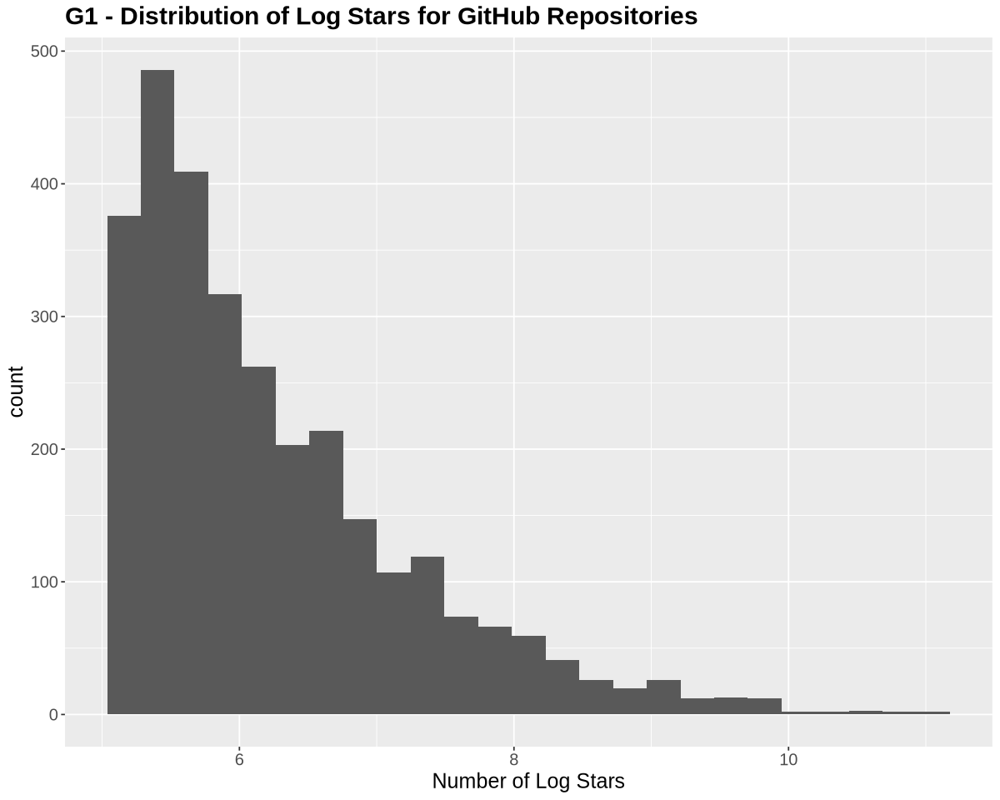

In [11]:
# distribution of number of stars in log
num_stars_hist <- repo_sample |>
    ggplot(aes(x = log(Stars))) +
    geom_histogram(bins=25) +
    labs(x = "Number of Log Stars", title = "G1 - Distribution of Log Stars for GitHub Repositories") +
    theme(
        text = element_text(size = 15),
        plot.title = element_text(face = "bold")
    )
num_stars_hist

In [12]:
p1 <- repo_sample |>
    ggplot(aes(x=Has.Issues, y=log(Stars))) +
    geom_boxplot() +
    labs(x="Has Issues", y = "Number of Log Stars") +
    theme(text = element_text(size = 15))
p2 <- repo_sample |>
    ggplot(aes(x=Has.Projects, y=log(Stars))) +
    geom_boxplot() +
    labs(x="Has Projects", y = "Number of Log Stars") +
    theme(text = element_text(size = 15))
p3 <- repo_sample |>
    ggplot(aes(x=Has.Downloads, y=log(Stars))) +
    geom_boxplot() +
    labs(x="Has Downloads", y = "Number of Log Stars") +
    theme(text = element_text(size = 15))
p4 <- repo_sample |>
    ggplot(aes(x=Has.Wiki, y=log(Stars))) +
    geom_boxplot() +
    labs(x="Has Wiki", y = "Number of Log Stars") +
    theme(text = element_text(size = 15))
p5 <- repo_sample |>
    ggplot(aes(x=Has.Pages, y=log(Stars))) +
    geom_boxplot() +
    labs(x="Has Pages", y = "Number of Log Stars") +
    theme(text = element_text(size = 15))
p6 <- repo_sample |>
    ggplot(aes(x=Has.Discussions, y=log(Stars))) +
    geom_boxplot() +
    labs(x="Has Discussions", y = "Number of Log Stars") +
    theme(text = element_text(size = 15))
p7 <- repo_sample |>
    ggplot(aes(x=Is.Fork, y=log(Stars))) +
    geom_boxplot() +
    labs(x="Is Fork", y = "Number of Log Stars") +
    theme(text = element_text(size = 15))
p8 <- repo_sample |>
    ggplot(aes(x=Is.Archived, y=log(Stars))) +
    geom_boxplot() +
    labs(x="Is Archived", y = "Number of Log Stars") +
    theme(text = element_text(size = 15))
p9 <- repo_sample |>
    ggplot(aes(x=Is.Template, y=log(Stars))) +
    geom_boxplot() +
    labs(x="Is Template", y = "Number of Log Stars") +
    theme(text = element_text(size = 15))

TableGrob (4 x 3) "arrange": 10 grobs
    z     cells    name                grob
1   1 (2-2,1-1) arrange      gtable[layout]
2   2 (2-2,2-2) arrange      gtable[layout]
3   3 (2-2,3-3) arrange      gtable[layout]
4   4 (3-3,1-1) arrange      gtable[layout]
5   5 (3-3,2-2) arrange      gtable[layout]
6   6 (3-3,3-3) arrange      gtable[layout]
7   7 (4-4,1-1) arrange      gtable[layout]
8   8 (4-4,2-2) arrange      gtable[layout]
9   9 (4-4,3-3) arrange      gtable[layout]
10 10 (1-1,1-3) arrange text[GRID.text.538]

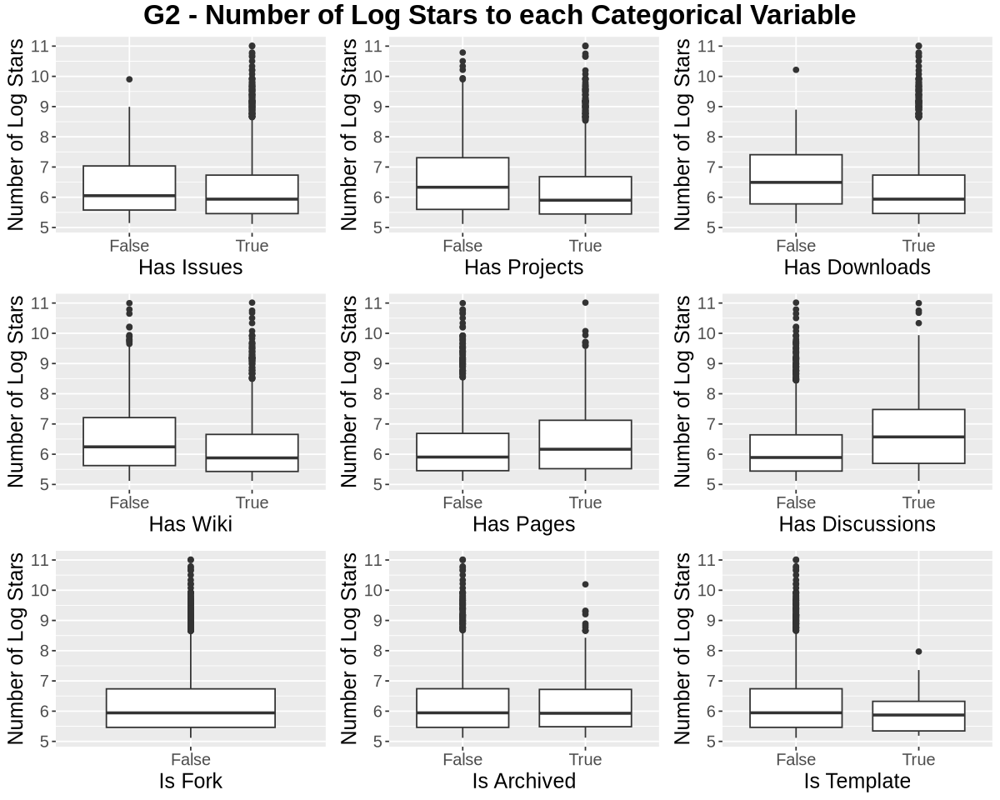

In [13]:
eda_boxplots <- grid.arrange(p1, p2, p3, p4, p5, p6, p7, p8, p9, nrow=3, ncol=3,
                            top = textGrob("G2 - Number of Log Stars to each Categorical Variable", gp=gpar(fontsize=20, font=2)))
eda_boxplots

From the boxplots, we notice overlapping plots for the different levels (`True` or `False`) of each categorical variable, indicating that we cannot make conclusions that the number of stars differs for the different levels. Additionally, the `Is.Fork` feature contains only one level, `False`. This variable does not provide any useful information for analysis because it does not vary across the dataset, so we will remove this feature. Further, we notice many outliers in the upper tail of the plots, so we may consider removing them before fitting the model depending on their validity.  

In [14]:
repo_sample <- repo_sample |> select(-Is.Fork)

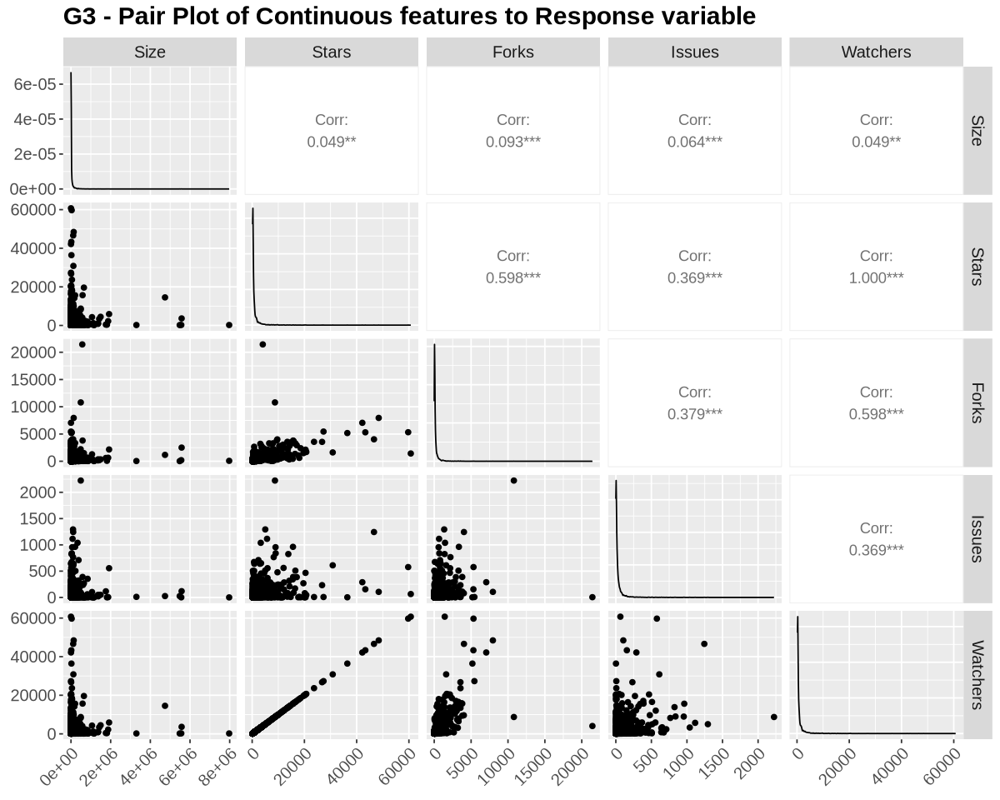

In [15]:
repo_pair_plots <- repo_sample |>
    ggpairs(columns = 1:5) +
    labs(title = "G3 - Pair Plot of Continuous features to Response variable") +
    theme(
        text = element_text(size = 15),
        plot.title = element_text(face = "bold"),
        axis.title = element_text(face = "bold"),
        axis.text.x = element_text(angle = 45, hjust = 1),  
        axis.text.y = element_text(angle = 0, hjust = 1)    
    )
repo_pair_plots

The pair plot above shows the relationships between the continuous variables and the response variable, `Stars`. We observe a strong linear relationship between `Watchers` and `Stars` with a correlation coefficient of 1, suggesting a perfect linear relationship. It will be important to consider whether to include the feature `Watchers` in the model as including it may lead to issues like multicollinearity nor be necessary for prediction purposes. Similarly, we notice a very weak relationship between `Size` and `Stars` with a correlation coefficient of 0.049, suggesting that this variable may not be as important to include in the model.  

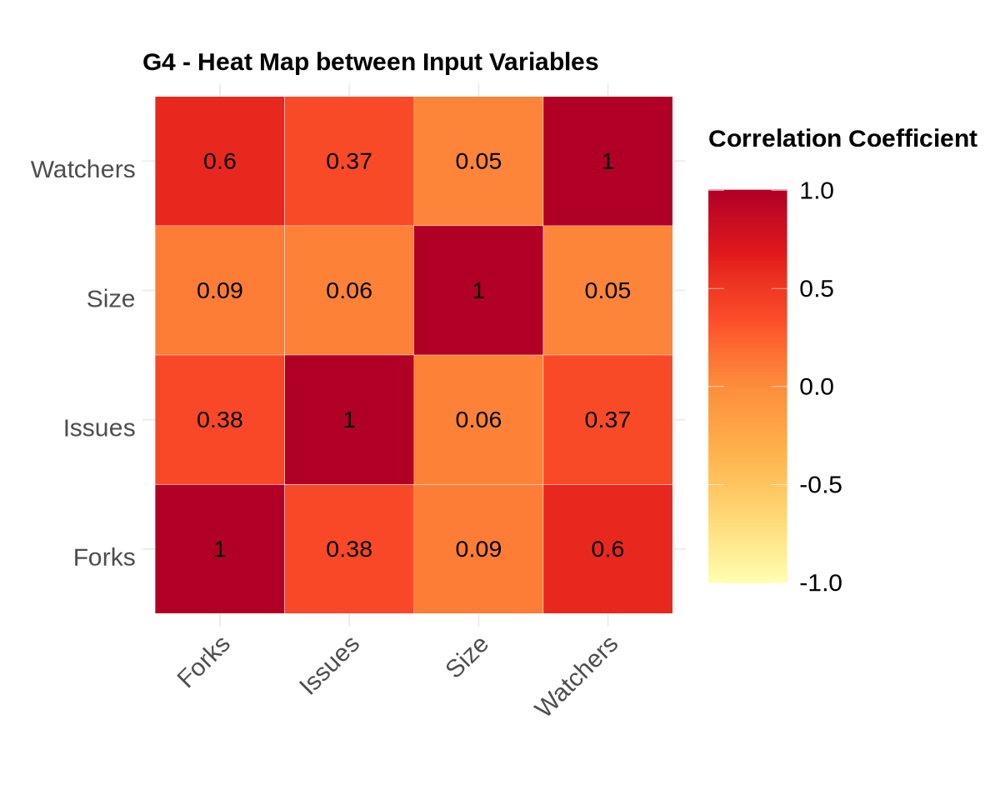

In [16]:
corr_matrix <- repo_sample %>%
   select(Size, Forks, Issues, Watchers) %>% 
   cor() %>%
   as.data.frame() %>%
   rownames_to_column("var1") %>%
   pivot_longer(-var1, names_to = "var2", values_to = "corr")

plot_corr_matrix <- corr_matrix %>%
   ggplot(aes(var1, var2)) +
   geom_tile(aes(fill = corr), color = "white") +
   scale_fill_distiller("Correlation Coefficient \n",
     palette =  "YlOrRd",
     direction = 1, limits = c(-1,1)
   ) +
   labs(x = "", y = "", title="G4 - Heat Map between Input Variables") +
   theme_minimal() +
   theme(
       text = element_text(size = 15),
       plot.title = element_text(face = "bold"),
       axis.text.x = element_text(
       angle = 45, vjust = 1,
       size = 18, hjust = 1
     ),
     axis.text.y = element_text(
       vjust = 1,
       size = 18, hjust = 1
     ),
     legend.title = element_text(size = 18, face = "bold"),
     legend.text = element_text(size = 18),
     legend.key.size = unit(2, "cm")
   ) +
   coord_fixed() +
   geom_text(aes(var1, var2, label = round(corr, 2)), color = "black", size = 6)
plot_corr_matrix

The heat map above provides insight into potential multicollinearity issues among input variables. We observe that the variables `Watchers` and `Forks` have a strong correlation with a correlation coefficient of 0.6, suggesting that we should consider leaving only one of two variables in our analysis. Although the remaining features do not show multicollinearity concerns based on the heat map, it is advisable to conduct further analysis using the Variance Inflation Factors (VIF) to detect multicollinearity.

## Methods and Plan

### Description of Methods:

1. Assess multicollinearity using the Variance Inflation Factors (VIF) method and remove outliers using the IQR method. 
2. Randomly split data into two sets, training and test sets, on a 70-30% basis. Fit a multiple regression model using all inputs in the data against the response variable and assess model assumptions. 
3. Use the stepwise selection algorithms, forward and backward selection to select the combination of features that minimizes Mallow's $C_p$ statistic. Conduct feature selection on the training set and indicate which features are selected for each of the two selection algorithms.
4. Fit a multiple regression model using the selected features on the training set, for both the forward and backward selection. Perform model diagnostics on the reduced models to assess model assumptions. 
5. Use the three trained models to predict the response, `Stars`, on the test set. Compare the forward and backward regression models' out-of-sample prediction performance using the Root Mean Squared Error (RMSE), where the smaller the RMSE, the better the model and its predictions.

### Appropriateness of Method
Multiple linear regression is appropriate for predicting in this dataset since the response variable, `Stars` is continuous and many possible predictors are numeric. 

Stepwise selection algorithms are easy to apply since they're an automated method to select important variables. By yielding a reduced model, it provides a simpler model that is easier to interpret. Forward selection is advantageous when dealing with a large number of potential predictors as the method sequentially adds variables. On the other hand, the backward selection is useful when dealing with collinear predictors. Since the method starts with the full model and considers the effects of all variables simultaneously, it identifies and removes redundant variables.

### Assumptions Required
- **Linearity**: Assume that there is a linear relationship between the predictor variables and the response variable.
- **Independence**: Assume the error terms are independent. 
- **Normality**: Assume the conditional distribution of error terms is Normal. However, the errors do not need to be Normal to satisfy this condition if the sample size is large since the Central Limit Theorem (CLT) gives an approximation for the sampling distribution. 
- **Homoscedasticity**: Assume the variance of the error terms is constant. 

### Potential Limitations or Weaknesses
- **Overfitting**: Stepwise selection algorithms may lead to overfitting and cannot be used when the number of predictors is larger than the sample size. 
- **Model Instability**: Stepwise selection algorithms do not consider all possible combinations since once variables are selected, they are not re-evaluated. Further, these algorithms are not guaranteed to select the best possible combination of variables since only partial contribution of variables are considered.
- **Biased Regression Coefficients**: Stepwise selection algorithms can produce biased regression coefficients.
- **Multiple Comparison**: Stepwise selection algorithms may result in higher type 1 error rates than the nominal level. This limitation can be mitigated by splitting the data into two parts.
- **Data Split Variability**: Randomly splitting the data into training and test sets can lead to variability in the performance of the selected model depending on the split of the data.


## Implementation of a proposed model

### Assess multicollinearity and outliers

In [17]:
# change categorical variables to factor
repo_sample[6:13] <- lapply(repo_sample[6:13], as.factor)

In [18]:
# check variables have been converted
sapply(repo_sample, is.factor)

Size           Stars           Forks          Issues        Watchers 
          FALSE           FALSE           FALSE           FALSE           FALSE 
     Has.Issues    Has.Projects   Has.Downloads        Has.Wiki       Has.Pages 
           TRUE            TRUE            TRUE            TRUE            TRUE 
Has.Discussions     Is.Archived     Is.Template 
           TRUE            TRUE            TRUE

In [19]:
# assess multicollinearity

# fit full model
full_mod <- lm(Stars~., data=repo_sample)

full_mod_results <- tidy(full_mod) %>% mutate_if(is.numeric, round, 2)
full_mod_results

Warning message in summary.lm(x):
“essentially perfect fit: summary may be unreliable”


term,estimate,std.error,statistic,p.value
<chr>,<dbl>,<dbl>,<dbl>,<dbl>
(Intercept),0,0,2.600000e-01,0.79
Size,0,0,-1.130000e+00,0.26
Forks,0,0,2.083000e+01,0.00
Issues,0,0,7.170000e+00,0.00
Watchers,1,0,1.404549e+17,0.00
Has.IssuesTrue,0,0,-5.600000e-01,0.58
Has.ProjectsTrue,0,0,1.700000e+00,0.09
Has.DownloadsTrue,0,0,-6.100000e-01,0.54
Has.WikiTrue,0,0,3.400000e-01,0.73


In [20]:
# calculate VIF
VIF_full_mod <- vif(full_mod)
round(VIF_full_mod, 3)

Warning message in summary.lm(object, ...):
“essentially perfect fit: summary may be unreliable”


Size           Forks          Issues        Watchers      Has.Issues 
          1.013           1.649           1.247           1.641           1.071 
   Has.Projects   Has.Downloads        Has.Wiki       Has.Pages Has.Discussions 
          1.561           1.015           1.609           1.012           1.092 
    Is.Archived     Is.Template 
          1.018           1.002

Using a VIF threshold of greater than 10 for detecting multicollinearity, we observe that none of the covariates exceed this value. However, as discussed in the EDA section of this data analysis, the feature `Watchers` had a perfect linear relationship with the response variable. Including such a variable in a predictive model is unnecessary as it will directly predict the response variable once its value is known. Thus, despite `Watchers` not indicating issues of multicollinearity, the variable should be removed from the model.  

In [21]:
red_mod <- repo_sample %>% select(-Watchers) %>% lm(Stars~., data = .)

red_mod_results <- tidy(red_mod) %>% mutate_if(is.numeric, round, 2)
red_mod_results

term,estimate,std.error,statistic,p.value
<chr>,<dbl>,<dbl>,<dbl>,<dbl>
(Intercept),1377.12,497.86,2.77,0.01
Size,0.00,0.00,-0.89,0.37
Forks,2.67,0.08,34.24,0.00
Issues,5.34,0.55,9.73,0.00
Has.IssuesTrue,-124.60,270.88,-0.46,0.65
Has.ProjectsTrue,-225.07,170.15,-1.32,0.19
Has.DownloadsTrue,-678.58,444.79,-1.53,0.13
Has.WikiTrue,-150.74,141.89,-1.06,0.29
Has.PagesTrue,239.05,123.90,1.93,0.05


In [22]:
# recheck VIF for reduced model
VIF_red_mod <- vif(red_mod)
round(VIF_red_mod, 3)

Size           Forks          Issues      Has.Issues    Has.Projects 
          1.013           1.185           1.209           1.071           1.560 
  Has.Downloads        Has.Wiki       Has.Pages Has.Discussions     Is.Archived 
          1.014           1.608           1.011           1.084           1.018 
    Is.Template 
          1.002

After removing `Watchers` from the model, we notice the "perfect fit" warning when fitting the full model including `Watchers` no longer occurs as we removed the variable with perfect correlation to the response. Further, we observe no issues of multicollinearity.

In [23]:
# remove variable with largest VIF to solve multicollinearity issue
repo_sample <- repo_sample %>% select(-Watchers)

In [24]:
# remove outliers 

# create function that finds outliers using IQR method
find_outliers <- function(x) {
    q1 <- quantile(x, prob=0.25)
    q3 <- quantile(x, prob=0.75)
    IQR = q3-q1
    outliers <- x < (q1 - (1.5*IQR)) | x > (q3 + (1.5*IQR))
    return(outliers)
}

# create function that removes outliers 
remove_outliers <- function(data, num_cols) {
    for(c in num_cols) {
        outliers <- find_outliers(data[[c]])
        data <- data[!outliers, ]
        
    }
    print("Outliers removed")
    return(data)
}

In [25]:
repo_sample <- remove_outliers(repo_sample, names(repo_sample)[sapply(repo_sample, is.numeric)]) 
nrow(repo_sample)

[1] "Outliers removed"


[1] 1889

Once outliers have been removed, the new sample size is 1889.

### Split Data into Train and Test Set

In [26]:
set.seed(2024)

repo_sample$ID <- rownames(repo_sample)
training_set <- sample_n(repo_sample, size = nrow(repo_sample) * 0.70,
  replace = FALSE
)

test_set <- anti_join(repo_sample,
  training_set,
  by = "ID"
)

training_set <- training_set  %>% select(-"ID")
test_set <- test_set %>% select(-"ID")

head(training_set)
nrow(training_set) # 1322

head(test_set)
nrow(test_set) # 567

,Size,Stars,Forks,Issues,Has.Issues,Has.Projects,Has.Downloads,Has.Wiki,Has.Pages,Has.Discussions,Is.Archived,Is.Template
,<int>,<int>,<int>,<int>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>
1,2909,910,197,0,True,True,True,True,False,False,False,False
2,6973,260,81,5,True,True,True,True,False,False,False,False
3,429,853,149,0,True,True,True,True,False,False,False,False
4,1702,262,25,7,True,True,True,True,False,False,False,False
5,102,185,60,8,True,True,True,True,False,False,False,False
6,1289,347,30,15,True,True,True,True,False,False,False,False


[1] 1322

,Size,Stars,Forks,Issues,Has.Issues,Has.Projects,Has.Downloads,Has.Wiki,Has.Pages,Has.Discussions,Is.Archived,Is.Template
,<int>,<int>,<int>,<int>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>
1,1549,216,7,9,True,True,True,True,False,False,False,False
2,32940,377,31,0,True,True,True,True,False,False,False,False
3,25559,926,102,9,True,True,True,True,False,False,False,False
4,8014,624,103,11,True,True,True,True,False,False,False,False
5,6999,715,101,1,True,True,True,True,False,False,False,False
6,3368,294,92,20,True,True,True,True,False,False,True,False


[1] 567

#### Fit the Full Model

In [27]:
# build full model with all 11 inputs against the response variable
full_OLS_mod <- lm(Stars~., data=training_set)
summary(full_OLS_mod)

# predict on test sset
pred_full_OLS <- predict(full_OLS_mod, newdata=test_set)
head(pred_full_OLS)


Call:
lm(formula = Stars ~ ., data = training_set)

Residuals:
    Min      1Q  Median      3Q     Max 
-537.97 -129.28  -54.64   62.75 1278.85 

Coefficients:
                      Estimate Std. Error t value Pr(>|t|)    
(Intercept)          4.215e+02  6.963e+01   6.053 1.85e-09 ***
Size                -6.393e-04  7.841e-04  -0.815   0.4150    
Forks                2.262e+00  1.251e-01  18.080  < 2e-16 ***
Issues               2.480e+00  6.007e-01   4.129 3.87e-05 ***
Has.IssuesTrue      -5.921e+01  4.377e+01  -1.353   0.1763    
Has.ProjectsTrue    -2.562e+01  2.702e+01  -0.948   0.3433    
Has.DownloadsTrue   -1.307e+02  5.958e+01  -2.194   0.0284 *  
Has.WikiTrue        -1.327e+01  2.215e+01  -0.599   0.5493    
Has.PagesTrue        4.053e+01  1.925e+01   2.106   0.0354 *  
Has.DiscussionsTrue  1.219e+02  2.403e+01   5.073 4.47e-07 ***
Is.ArchivedTrue     -1.000e+01  2.640e+01  -0.379   0.7049    
Is.TemplateTrue      7.659e+01  9.129e+01   0.839   0.4017    
---
Signif. codes:  

1        2        3        4        5        6 
229.8198 241.7210 429.3748 447.8141 419.1365 438.2216

#### Check Assumptions of Linear Regression Modelling for the Full Model

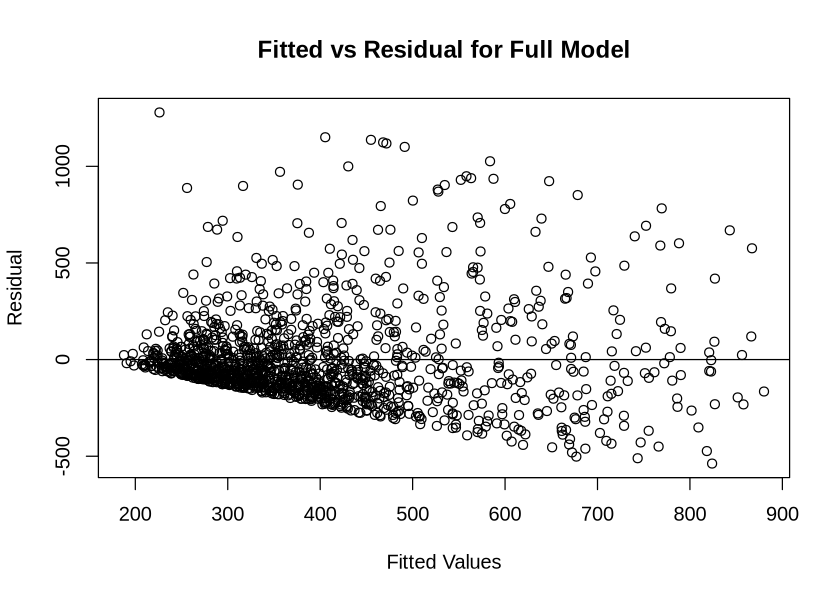

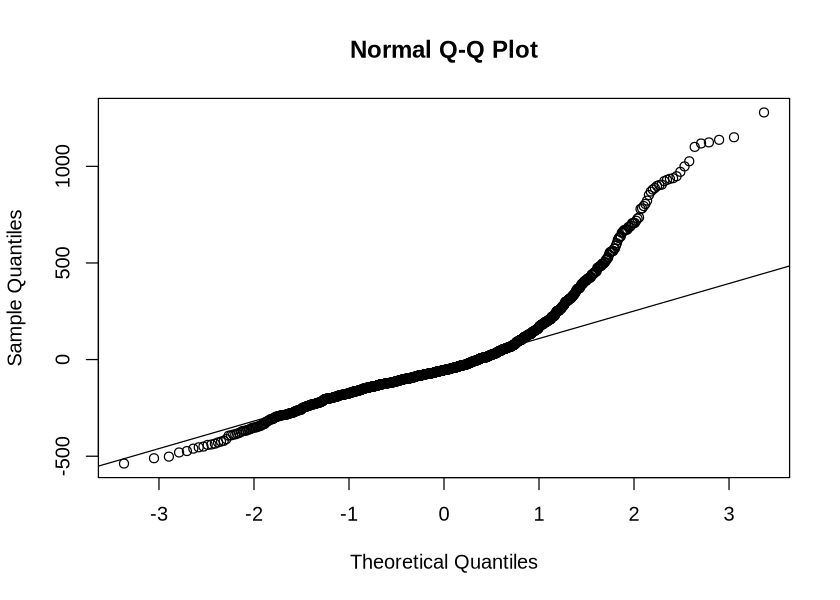

In [41]:
options(repr.plot.width = 7, repr.plot.height =5)

# residual plot of full model
plot(fitted(full_OLS_mod), resid(full_OLS_mod),
     xlab = "Fitted Values", ylab = "Residual",
     main = "Fitted vs Residual for Full Model")
abline(0,0)

qqnorm(resid(full_OLS_mod)) 
qqline(resid(full_OLS_mod))

From the residual plots above for the full model, we notice that the assumptions of homoscedasticity, linearity, and normality are violated. We observe a funnelling pattern in the fitted versus residual plot, suggesting non-constant variance and a non-linear relationship within the data. Further, the points on the Q-Q plot deviate from the reference line, suggesting that the error terms do not follow a Normal Distribution. However, since the sample size is large by CLT, the errors do not need to be Normal.

### Model Selection

#### Forward Selection

In [42]:
# forward selection
forward_sel <- regsubsets(
  x=Stars~., data = training_set,
  nvmax = 11,
  method = "forward"
)
forward_sel

forward_sel_summary <- summary(forward_sel)

forward_sel_summary <- tibble(
   n_input_variables = 1:11,
   Cp = forward_sel_summary$cp
)
forward_sel_summary

# select variables
cp_min_forward = which.min(forward_sel_summary$Cp) 
coef_names_fw <- gsub("(True)$", "", names(coef(forward_sel, cp_min_forward)))
selected_var_forward <- coef_names_fw[-1]
selected_var_forward

training_subset_forward <- training_set %>% select(all_of(selected_var_forward), Stars)

Subset selection object
Call: regsubsets.formula(x = Stars ~ ., data = training_set, nvmax = 11, 
    method = "forward")
11 Variables  (and intercept)
                    Forced in Forced out
Size                    FALSE      FALSE
Forks                   FALSE      FALSE
Issues                  FALSE      FALSE
Has.IssuesTrue          FALSE      FALSE
Has.ProjectsTrue        FALSE      FALSE
Has.DownloadsTrue       FALSE      FALSE
Has.WikiTrue            FALSE      FALSE
Has.PagesTrue           FALSE      FALSE
Has.DiscussionsTrue     FALSE      FALSE
Is.ArchivedTrue         FALSE      FALSE
Is.TemplateTrue         FALSE      FALSE
1 subsets of each size up to 11
Selection Algorithm: forward

n_input_variables,Cp
<int>,<dbl>
1,61.444042
2,29.731896
3,14.768711
4,10.483591
5,7.812858
6,5.691578
7,5.828760
8,7.169041
9,8.473004


[1] "Forks"           "Issues"          "Has.Projects"    "Has.Downloads"  
[5] "Has.Pages"       "Has.Discussions"

In [43]:
summary(forward_sel)

Subset selection object
Call: regsubsets.formula(x = Stars ~ ., data = training_set, nvmax = 11, 
    method = "forward")
11 Variables  (and intercept)
                    Forced in Forced out
Size                    FALSE      FALSE
Forks                   FALSE      FALSE
Issues                  FALSE      FALSE
Has.IssuesTrue          FALSE      FALSE
Has.ProjectsTrue        FALSE      FALSE
Has.DownloadsTrue       FALSE      FALSE
Has.WikiTrue            FALSE      FALSE
Has.PagesTrue           FALSE      FALSE
Has.DiscussionsTrue     FALSE      FALSE
Is.ArchivedTrue         FALSE      FALSE
Is.TemplateTrue         FALSE      FALSE
1 subsets of each size up to 11
Selection Algorithm: forward
          Size Forks Issues Has.IssuesTrue Has.ProjectsTrue Has.DownloadsTrue
1  ( 1 )  " "  "*"   " "    " "            " "              " "              
2  ( 1 )  " "  "*"   " "    " "            " "              " "              
3  ( 1 )  " "  "*"   "*"    " "            " "              "

We observe that the forward algorithm would select a predictive model with 6 variables that minimized Mallows' $C_p$, with a value of 5.69.

The selected variables are:
1. Forks
2. Issues
3. Has.Projects
4. Has.Downloads
5. Has.Pages
6. Has.Discussions

#### Backward Selection

In [44]:
# backward selection
backward_sel <- regsubsets(
  x=Stars~., data = training_set,
  nvmax = 11,
  method = "backward"
)
backward_sel

backward_sel_summary <- summary(backward_sel)

backward_sel_summary <- tibble(
   n_input_variables = 1:11,
   Cp = backward_sel_summary$cp
)
backward_sel_summary

# select variables
cp_min_backward = which.min(backward_sel_summary$Cp) 
coef_names_bw <- gsub("(True)$", "", names(coef(backward_sel, cp_min_backward)))
selected_var_backward <- coef_names_bw[-1]
selected_var_backward

training_subset_backward <- training_set %>% select(all_of(selected_var_backward), Stars)

Subset selection object
Call: regsubsets.formula(x = Stars ~ ., data = training_set, nvmax = 11, 
    method = "backward")
11 Variables  (and intercept)
                    Forced in Forced out
Size                    FALSE      FALSE
Forks                   FALSE      FALSE
Issues                  FALSE      FALSE
Has.IssuesTrue          FALSE      FALSE
Has.ProjectsTrue        FALSE      FALSE
Has.DownloadsTrue       FALSE      FALSE
Has.WikiTrue            FALSE      FALSE
Has.PagesTrue           FALSE      FALSE
Has.DiscussionsTrue     FALSE      FALSE
Is.ArchivedTrue         FALSE      FALSE
Is.TemplateTrue         FALSE      FALSE
1 subsets of each size up to 11
Selection Algorithm: backward

n_input_variables,Cp
<int>,<dbl>
1,61.444042
2,29.731896
3,14.768711
4,10.483591
5,7.812858
6,5.691578
7,5.828760
8,7.169041
9,8.473004


[1] "Forks"           "Issues"          "Has.Projects"    "Has.Downloads"  
[5] "Has.Pages"       "Has.Discussions"

In [45]:
summary(backward_sel)

Subset selection object
Call: regsubsets.formula(x = Stars ~ ., data = training_set, nvmax = 11, 
    method = "backward")
11 Variables  (and intercept)
                    Forced in Forced out
Size                    FALSE      FALSE
Forks                   FALSE      FALSE
Issues                  FALSE      FALSE
Has.IssuesTrue          FALSE      FALSE
Has.ProjectsTrue        FALSE      FALSE
Has.DownloadsTrue       FALSE      FALSE
Has.WikiTrue            FALSE      FALSE
Has.PagesTrue           FALSE      FALSE
Has.DiscussionsTrue     FALSE      FALSE
Is.ArchivedTrue         FALSE      FALSE
Is.TemplateTrue         FALSE      FALSE
1 subsets of each size up to 11
Selection Algorithm: backward
          Size Forks Issues Has.IssuesTrue Has.ProjectsTrue Has.DownloadsTrue
1  ( 1 )  " "  "*"   " "    " "            " "              " "              
2  ( 1 )  " "  "*"   " "    " "            " "              " "              
3  ( 1 )  " "  "*"   "*"    " "            " "             

We observe that the backward algorithm would select a predictive model with 6 variables that minimized Mallows' $C_p$, with a value of 5.69.

The selected variables are:
1. Forks
2. Issues
3. Has.Projects
4. Has.Downloads
5. Has.Pages
6. Has.Discussions

### Build and Compare Predictive Models 

In [46]:
# use variables selected by forward selection to build predictive model
red_forward_OLS <- lm(Stars ~ .,
  training_subset_forward
)

summary(red_forward_OLS)


Call:
lm(formula = Stars ~ ., data = training_subset_forward)

Residuals:
    Min      1Q  Median      3Q     Max 
-550.45 -131.68  -53.76   61.05 1278.93 

Coefficients:
                     Estimate Std. Error t value Pr(>|t|)    
(Intercept)          374.6121    60.7471   6.167 9.26e-10 ***
Forks                  2.2766     0.1238  18.390  < 2e-16 ***
Issues                 2.3539     0.5921   3.976 7.40e-05 ***
Has.ProjectsTrue     -41.9808    20.6689  -2.031   0.0424 *  
Has.DownloadsTrue   -141.0176    59.0876  -2.387   0.0171 *  
Has.PagesTrue         41.2338    19.1807   2.150   0.0318 *  
Has.DiscussionsTrue  119.9003    23.8058   5.037 5.40e-07 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 240.4 on 1315 degrees of freedom
Multiple R-squared:  0.2488,	Adjusted R-squared:  0.2454 
F-statistic:  72.6 on 6 and 1315 DF,  p-value: < 2.2e-16


In [47]:
# use variables selected by backward selection to build predictive model
red_backward_OLS <- lm(Stars ~ .,
  training_subset_backward
)

summary(red_backward_OLS)


Call:
lm(formula = Stars ~ ., data = training_subset_backward)

Residuals:
    Min      1Q  Median      3Q     Max 
-550.45 -131.68  -53.76   61.05 1278.93 

Coefficients:
                     Estimate Std. Error t value Pr(>|t|)    
(Intercept)          374.6121    60.7471   6.167 9.26e-10 ***
Forks                  2.2766     0.1238  18.390  < 2e-16 ***
Issues                 2.3539     0.5921   3.976 7.40e-05 ***
Has.ProjectsTrue     -41.9808    20.6689  -2.031   0.0424 *  
Has.DownloadsTrue   -141.0176    59.0876  -2.387   0.0171 *  
Has.PagesTrue         41.2338    19.1807   2.150   0.0318 *  
Has.DiscussionsTrue  119.9003    23.8058   5.037 5.40e-07 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 240.4 on 1315 degrees of freedom
Multiple R-squared:  0.2488,	Adjusted R-squared:  0.2454 
F-statistic:  72.6 on 6 and 1315 DF,  p-value: < 2.2e-16


We observe that the forward and backward algorithms selected the same subset of variables, thus resulting in the same model. The coefficient estimates' corresponding p-values are all significant, suggesting the relationships in the reduced models are statistically significant.

#### Check Assumptions of Linear Regression Modelling for the Reduced Models

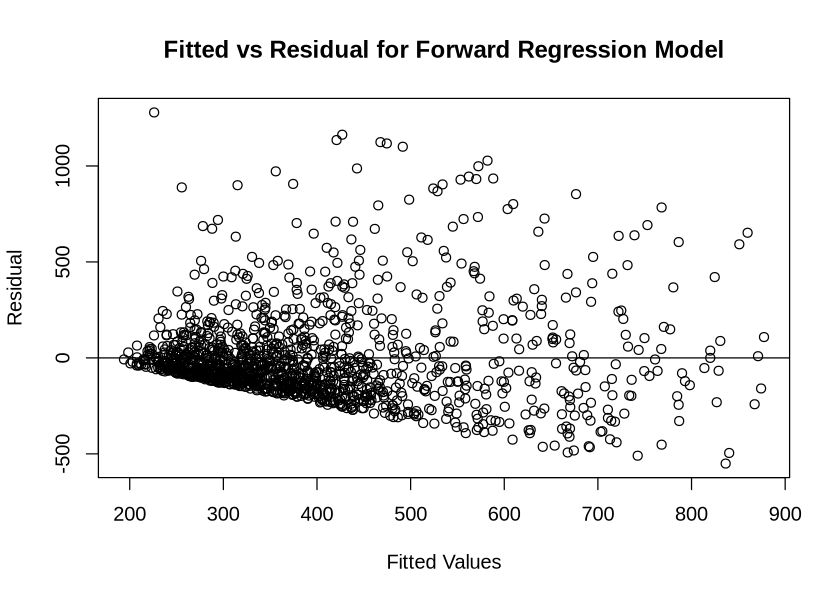

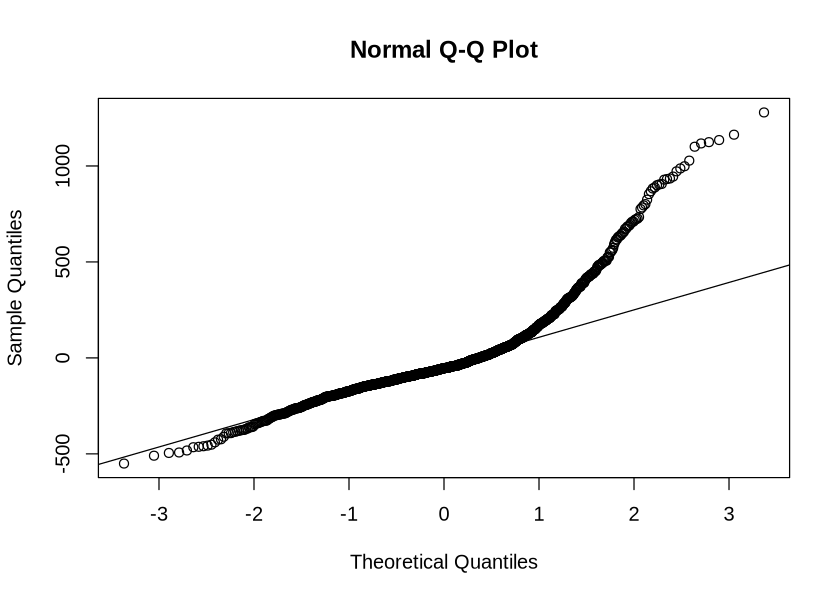

In [48]:
plot(fitted(red_forward_OLS), resid(red_forward_OLS),
                      xlab = "Fitted Values", ylab = "Residual",
                      main = "Fitted vs Residual for Forward Regression Model")
abline(0,0)

qqnorm(resid(red_forward_OLS))
qqline(resid(red_forward_OLS))

Since the forward and backward algorithms select the same variables thus resulting in the same model, so without loss of generality, we investigate the linear regression modelling assumptions for the forward model. 

From the residual plots above for the forward model, we notice that the assumptions of homoscedasticity, linearity, and normality are violated. We observe a funnelling pattern in the fitted versus residual plot, suggesting non-constant variance and a non-linear relationship within the data. Further, the points on the Q-Q plot deviate from the reference line, suggesting that the error terms do not follow a Normal Distribution. However, since the sample size is large by CLT, the errors do not need to be Normal.

Possible explanations behind these violations and suggestions to improve the model:
- To capture potential non-linear relationships, power transformations of order two can be applied to select variables.
- To investigate the combined influence of variables on the response variable, all possible interaction terms can be generated and included in the feature selection.
- To reduce the skewness in the response variable, transformations such as the log transformation can be applied to the response variable in feature selection and prediction. 

#### Predict and Compare Models

In [49]:
# predict on test set using forward model
pred_red_forward_OLS <- predict(red_forward_OLS, newdata=test_set)

# predict on test set using backward model
pred_red_backward_OLS <- predict(red_backward_OLS, newdata=test_set)

In [50]:
# compute RMSE of full OLS model
RMSE_models <- tibble(
  Model = "OLS Full Regression",
  RMSE = rmse(pred_full_OLS, test_set$Stars)
)
RMSE_models

Model,RMSE
<chr>,<dbl>
OLS Full Regression,258.0258


In [51]:
# compute RMSE of reduced models 
RMSE_models <- rbind(
  RMSE_models,
  tibble(
    Model = c("OLS Reduced Forward Regression", "OLS Reduced Backward Regression"),
    RMSE = c(rmse(pred_red_forward_OLS, test_set$Stars), rmse(pred_red_backward_OLS, test_set$Stars))
    )
  )
RMSE_models

Model,RMSE
<chr>,<dbl>
OLS Full Regression,258.0258
OLS Reduced Forward Regression,258.1898
OLS Reduced Backward Regression,258.1898


By comparing the RMSE of the two reduced models, we find that the RMSE of the forward and backward regression models were the same because the two methods selected the following same variables, `Forks`, `Issues`, `Has.Projects`, `Has.Downloads`, `Has.Pages`, and `Has.Discussions` for predicting the number of stars a repository receives for new observations. This was unexpected as forward and backward algorithms typically select different subsets of variables. 

The RMSE of the full model is lower than that of the reduced ones, forward and backward, with a marginal difference of 0.164 to three decimal places. In the reduced models, the assumptions of homoscedasticity, linearity, and normality are violated and may be addressed through feature engineering and transformation in feature selection, considering interaction terms to investigate the combined influence of variables on the response, power transforming to capture potential non-linear relationships and log transforming the response variable to reduce skewness. 

## References

Madley‐Dowd, P., Hughes, R. A., Tilling, K., & Heron, J. (2019). The proportion of missing data should not be used to guide decisions on multiple imputation. Journal of Clinical Epidemiology, 110, 63–73. https://doi.org/10.1016/j.jclinepi.2019.02.016

Most popular GitHub repositories (Projects). (2023, October 1). Kaggle. https://www.kaggle.com/datasets/donbarbos/github-repos/data